In [1]:
import torch
import torchvision
import numpy as np
import matplotlib.pyplot as plt
import torch.nn as nn
import pandas as pd
import os
import cv2
from torchvision import transforms
from matplotlib.pyplot import figure
from PIL import Image
from pathlib import Path
import tqdm
from skimage.transform import resize
from sklearn.model_selection import train_test_split
from pathlib import Path

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")


#device = torch.device("cpu")

In [ ]:
import bitsandbytes as bnb

In [ ]:
!pip install bitsandbytes

     ---------------------------------------- 76.3/76.3 MB 1.8 MB/s eta 0:00:00


1. Предобучение генератора

Для того, чтобы дискриминатор не начал сильно выигрывать изначально при обучении из-за того, что генератор выдает шум, сначала предобучим генератор просто с помощью MSEloss, который будет считаться от изначального изображения и выхода генератора 

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Функция, которая возвращает пути до изображений 
нашего датасета

In [ ]:
#image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

def fetch_dataset():
    folder_name = '/content/drive/MyDrive/Flickr2K'
    #folder_name = 'Flickr2K'
    photo_paths = []
    for dirpath, dirnames, filenames in os.walk(folder_name):
        for fname in filenames:
            if fname.endswith('.png'):
                fpath = os.path.join(dirpath, fname)
                photo_paths.append(fpath)
    print(len(photo_paths))
    return photo_paths

In [ ]:
data = fetch_dataset()

3301


Типичное изображение из датасета выглядит так:

(2040, 2040, 3) <class 'numpy.ndarray'>


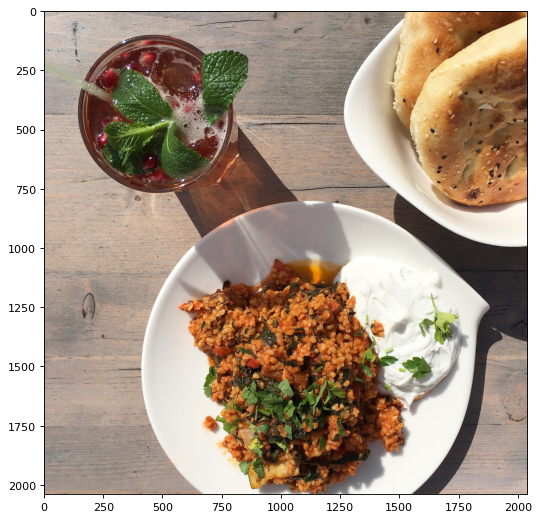

In [ ]:
photo = cv2.imread(data[16])[:,:,::-1]
figure(figsize=(12, 8), dpi=80)
plt.imshow(photo)
print(photo.shape, type(photo))

теперь напишем класс MyDataset, с помощью которого можно получить доступ к изображениям

In [ ]:
class MyDataset(torch.utils.data.Dataset):
    def __init__(self, files):
        super().__init__()
        self.files = files
        self.len_ = len(self.files)

    def __len__(self):
        return self.len_

    def load_sample(self, file):
        image = Image.open(file)
        image.load()
        return image

    def __getitem__(self, index):
        transform = transforms.Compose([
            #transforms.ToTensor(),
            transforms.RandomHorizontalFlip(),
            transforms.RandomVerticalFlip(),
            #transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),    
        ])
        x = Image.open(data[index])
        x.load()
        x = transform(x) 
        x = np.array(np.array(x) / 255, dtype=np.float32)
        return torch.from_numpy(x).permute(2, 0, 1)

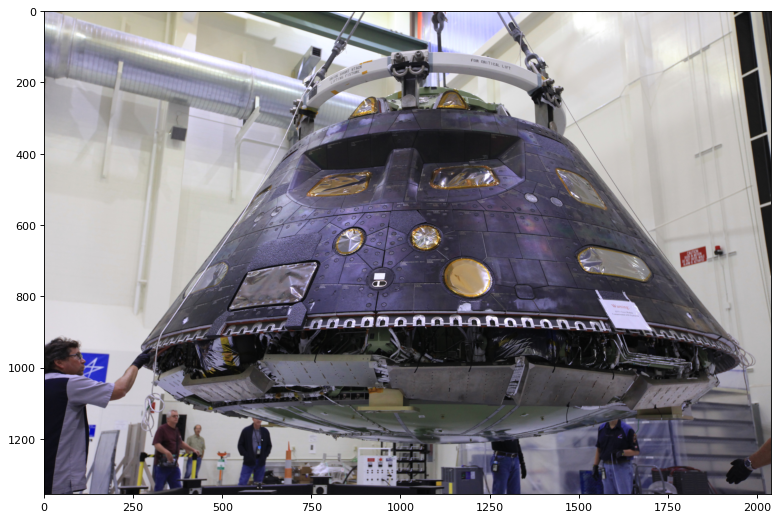

In [ ]:
dataset = MyDataset(data)
figure(figsize=(12, 8), dpi=80)
plt.imshow(dataset[114].permute(1, 2, 0)) 
plt.show()

In [ ]:
dataset[157].shape

torch.Size([3, 1356, 2040])

In [ ]:
import pandas as pd
width = []
height = []
for x in dataset:
    width.append(x.shape[1]) 
    height.append(x.shape[2])

In [ ]:
#from pyparsing.helpers import col
d = {'width': width, 'height': height}
df = pd.DataFrame(d)
df.head()

,width,height
0,1356,2040
1,1356,2040
2,1200,1608
3,1356,2040
4,1356,2040


In [ ]:
df.describe()

,width,height
count,252.000000,252.000000
mean,1466.285714,1942.285714
std,276.668365,231.602313
min,768.000000,1140.000000
25%,1356.000000,2040.000000
50%,1356.000000,2040.000000
75%,1524.000000,2040.000000
max,2040.000000,2040.000000


In [ ]:
df.value_counts()

width  height
1356   2040      103
1524   2040       18
2040   1356       16
1344   2040       10
1536   2040        9
                ... 
1164   2040        1
1548   2040        1
1572   2040        1
1296   2040        1
768    2040        1
Length: 65, dtype: int64

Функция, которая уменьшает разрешение изображения, для того, чтобы подавать его в генератор

In [2]:
def downsize(img, scale_factor=4):
    s = img.shape
    #print(s)
    new_img = None
    if len(s) == 4:
        img = img.permute(0, 2, 3, 1).cpu().numpy()
        dimx = img.shape[1] / scale_factor
        dimy = img.shape[2] / scale_factor
        images = []
        for i in img:
            new_img = resize(i, [dimx, dimy])
            images.append(new_img)
        new_img = np.array(images)
    else:
        img = img.permute(1, 2, 0).cpu().numpy()
        dimx = img.shape[0] / scale_factor
        dimy = img.shape[1] / scale_factor
        new_img = resize(img, [dimx, dimy])
    
    if len(s) == 4:
        new_size = new_img.shape
        #print(new_size)
        return torch.from_numpy(new_img).permute(0, 3, 1, 2).to(device)
        #return new_img.permute(2, 0, 1).reshape(1, 3, new_size[0], new_size[1])  
    return torch.from_numpy(new_img).permute(2, 0, 1)

Эта функция делает изображение квадратным 1024 * 1024 (понадобится позже)

In [3]:
def change_size(img, dimx=1024, dimy = 1024):
    s = img.shape
    img = img.permute(1, 2, 0).cpu().numpy()
    new_img = resize(img, [dimx, dimy])
    return torch.from_numpy(new_img).permute(2, 0, 1).numpy()

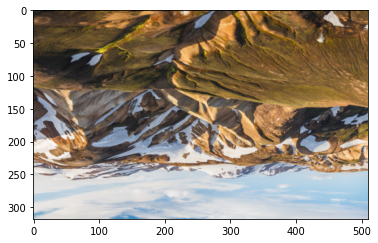

In [ ]:
plt.imshow(downsize(dataset[158]).permute(1, 2, 0)) 

Архитектура генератора выглядит следующим образом:

In [4]:
class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        self.prep = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=64, kernel_size=9, stride=1, padding=4),
            nn.PReLU()
        )
        self.block_1 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.PReLU(),
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
        )
        self.block_2 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.PReLU(),
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
        )
        self.block_3 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.PReLU(),
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
        )
        self.block_4 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.PReLU(),
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
        )
        self.block_5 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.PReLU(),
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
        )
        self.out_prep = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm2d(64),
        )
        self.out_conv_1 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=256, kernel_size=3, stride=1, padding=1),
        )
        self.out_p_relu_1 = nn.Sequential(
            nn.PReLU()
        )
        self.out_conv_2 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=256, kernel_size=3, stride=1, padding=1),
        )
        self.out_p_relu_2 = nn.Sequential(
            nn.PReLU()
        )
        self.last_conv = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=3, kernel_size=9, stride=1, padding=4)
        )
    def forward(self, input):
        DEBUG = False
        if DEBUG:
            print('input.shape: ', input.shape)

        x = self.prep(input)
        if DEBUG:
            print('x.shape: ', x.shape)
        
        y1 = self.block_1(x)
        if(DEBUG):
            print('y1.shape: ', y1.shape)

        y1 = y1 + x
        y2 = self.block_2(y1)
        y2 = y2 + y1
        y3 = self.block_3(y2)
        y3 = y3 + y2
        y4 = self.block_4(y3)
        y4 = y4 + y3
        y5 = self.block_5(y4)
        y5 = y5 + y4

        if DEBUG:
            print('y5.shape: ', y5.shape, ' y4.shape: ', y4.shape)

        y5 = self.out_prep(y5)
        y5 = y5 + x

        if DEBUG:
            print('y5 out_prep.shape: ', y5.shape)

        pixel_shuffle = nn.PixelShuffle(2)

        y5 = self.out_conv_1(y5)

        if DEBUG:
            print('y5 out_conv_1.shape: ', y5.shape)

        y5 = pixel_shuffle(y5)
        if DEBUG:
            print('y5 pixel_shuffle1.shape: ', y5.shape)

        y5 = self.out_p_relu_1(y5)
        y5 = self.out_conv_2(y5)

        if DEBUG:
            print('y5 out_conv_2.shape: ', y5.shape)

        y5 = pixel_shuffle(y5)
        y5 = self.out_p_relu_2(y5)

        if DEBUG:
            print('y5 pixel_shuffle2.shape: ', y5.shape)

        y5 = self.last_conv(y5)

        if DEBUG:
            print('y5 last_conv.shape: ', y5.shape)

        return y5


Архитектура дискриминатора (он понадобится позже):

In [23]:
CH_SIZE = 16
class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.prep = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=CH_SIZE, kernel_size=6, stride=2),
            nn.LeakyReLU()
        )
        self.block_1 = nn.Sequential(
            nn.Conv2d(in_channels=CH_SIZE, out_channels=CH_SIZE * 2, kernel_size=6, stride=2),
            #nn.BatchNorm2d(CH_SIZE * 2),
            nn.LeakyReLU(),
        )
        self.block_2 = nn.Sequential(
            nn.Conv2d(in_channels=CH_SIZE * 2, out_channels=CH_SIZE * 4, kernel_size=6, stride=2),
            #nn.BatchNorm2d(CH_SIZE * 4),
            nn.LeakyReLU(),
        )
        self.block_3 = nn.Sequential(
            nn.Conv2d(in_channels=CH_SIZE * 4, out_channels=CH_SIZE * 8, kernel_size=6, stride=2),
            #nn.BatchNorm2d(CH_SIZE * 8),
            nn.LeakyReLU(),
        )
        self.block_4 = nn.Sequential(
            nn.Conv2d(in_channels=CH_SIZE * 8, out_channels=CH_SIZE * 16, kernel_size=6, stride=2),
            #nn.BatchNorm2d(CH_SIZE * 16),
            nn.LeakyReLU(),
        )
        self.block_5 = nn.Sequential(
            nn.Conv2d(in_channels=CH_SIZE * 16, out_channels=CH_SIZE * 32, kernel_size=6, stride=2),
            #nn.BatchNorm2d(CH_SIZE * 32),
            nn.LeakyReLU(),
        )
        self.block_6 = nn.Sequential(
            nn.Conv2d(in_channels=CH_SIZE * 32, out_channels=CH_SIZE * 64, kernel_size=6, stride=2),
            #nn.BatchNorm2d(CH_SIZE * 64),
            nn.LeakyReLU(),
        )
        self.block_7 = nn.Sequential(
            nn.Conv2d(CH_SIZE * 64, out_channels=1, kernel_size=4, stride=1, padding=0, bias=False),
            nn.Flatten(),
            nn.Sigmoid(),
        )
        
    
    def forward(self, input):
        DEBUG = False
        if DEBUG:
            print('input:', input.shape)
        x = self.prep(input)
        if DEBUG:
            print('prep:', x.shape)
        x = self.block_1(x)
        if DEBUG:
            print('block_1:', x.shape)
        x = self.block_2(x)
        if DEBUG:
            print('block_2:', x.shape)
        x = self.block_3(x)
        if DEBUG:
            print('block_3:', x.shape)
        x = self.block_4(x)
        if DEBUG:
            print('block_4:', x.shape)
        x = self.block_5(x)
        if DEBUG:
            print('block_5:', x.shape)
        x = self.block_6(x)
        if DEBUG:
            print('block_6:', x.shape)
        x = self.block_7(x) 
        if DEBUG:
            print('block_7:', x.shape)   
        return x.view(-1)

In [7]:
generator = Generator().to(device)

In [ ]:
for p in generator.parameters():
    print(type(p))

In [ ]:
data_loader = torch.utils.data.DataLoader(dataset=dataset, batch_size=1, shuffle=False)

In [ ]:
for x in data_loader:
    print(type(x), x.shape)
    break


<class 'torch.Tensor'> torch.Size([1, 3, 1356, 2040])


Итак, предобучаем наш генератор:

In [ ]:
def pre_train(model, loader, epochs):
    loss_history = []
    optimizer = torch.optim.Adam(model.parameters())
    criterion = torch.nn.functional.mse_loss
    for ephoch in tqdm.notebook.tqdm(range(epochs)):
        model.train()
        losses_per_epoch = []
        for batch in tqdm.notebook.tqdm(loader):           
            reduсed_batch = downsize(batch)
            #print(reduсed_batch.shape, batch.shape)
            #reduсed_batch = reduсed_batch.to(device)#.permute(0, 3, 1, 2)
            #batch = batch.to(device)   
            optimizer.zero_grad()
            output = model(reduсed_batch.to(device))
            loss = criterion(output.type(torch.float32).cpu() , batch)
            loss.backward()
            optimizer.step()
            losses_per_epoch.append(loss.item())
        loss_history.append(np.mean(losses_per_epoch))

    return loss_history

In [ ]:
torch.cuda.empty_cache()

In [ ]:
history = pre_train(generator, data_loader, epochs=3)

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

In [ ]:
history1 = pre_train(generator, data_loader, epochs=3)

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

In [ ]:
history2 = pre_train(generator, data_loader, epochs=3)

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Для успешного обцчения потребовалось несколько попыток. Сохраняем самый успешный вариант. При обучении использовалось всего ~200 изображений из датасета

In [ ]:
torch.save(generator.state_dict(), 'weight')

In [ ]:
history3 = pre_train(generator, data_loader, epochs=3)

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/252 [00:00<?, ?it/s]

  0%|          | 0/252 [00:00<?, ?it/s]

  0%|          | 0/252 [00:00<?, ?it/s]

График зависимости лосса от эпохи для генератора.

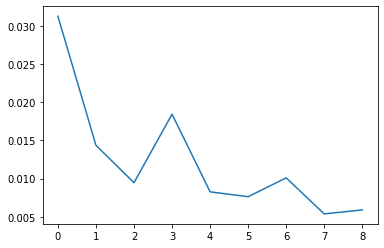

In [ ]:
plt.plot(history + history1 + history2)

Также график зависимости лосса от эпохи для генератора. Эта попытка была отброшена, так как в конце лосс сильно взлетел, а качество упало

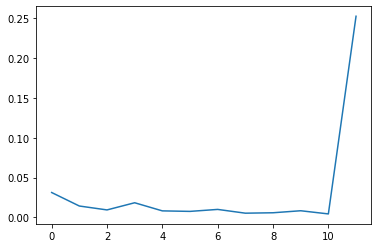

In [ ]:
plt.plot(history + history1 + history2 + history3)

In [60]:
generator.load_state_dict(torch.load('weight', map_location=torch.device(device)))

<All keys matched successfully>

И вот как генератор восстанавливает изображения. Первое фото - оригинальное, но уменьшенное изображение, второе - восстановленное изображение с помощью генератора

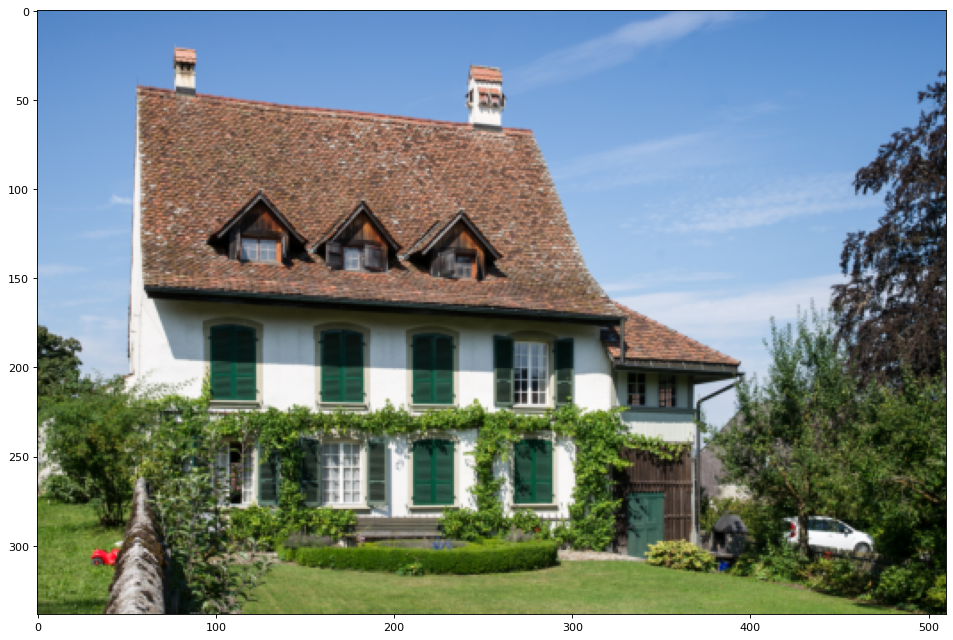

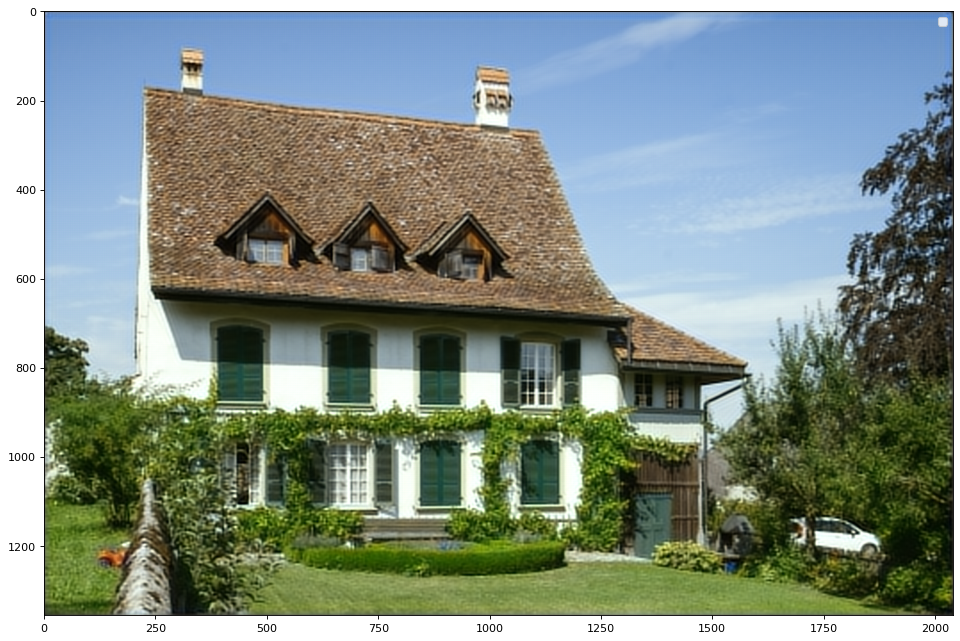

In [ ]:
#img = downsize(dataset[22])
img = downsize(loaded_dataloader[22])
figure(figsize=(16, 10), dpi=80)
plt.show()
s = img.shape

with torch.no_grad():
    generator.eval()
    reconstructed = generator(img.to(device).view(1, s[0], s[1], s[2]))

figure(figsize=(16, 10), dpi=80)
r = reconstructed.shape
reconstructed = reconstructed.cpu().view(r[1], r[2], r[3]).permute(1, 2, 0)
reconstructed = np.array(reconstructed, dtype=np.float32)
plt.legend()
plt.show()  

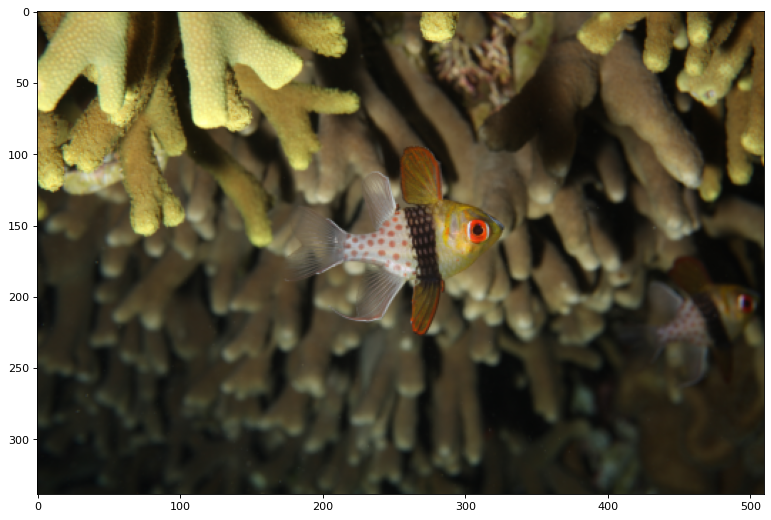

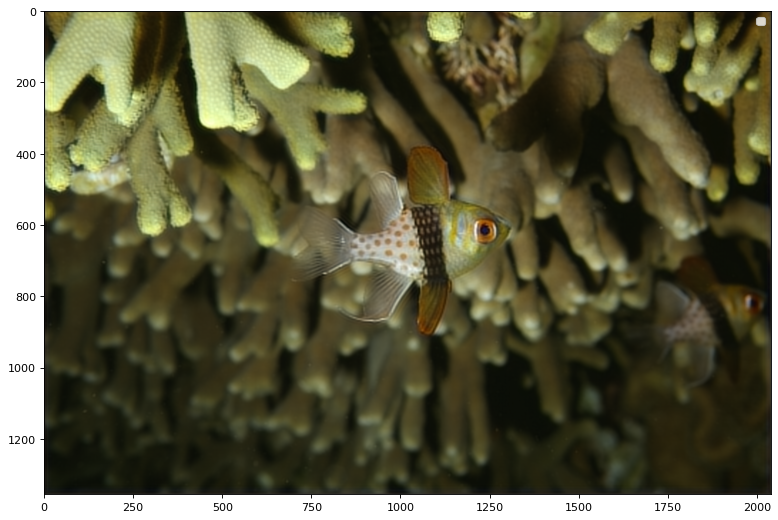

In [ ]:
img = downsize(dataset[139])
figure(figsize=(12, 8), dpi=80)
plt.show()
s = img.shape

with torch.no_grad():
    generator.eval()
    reconstructed = generator(img.to(device).view(1, s[0], s[1], s[2]))

figure(figsize=(12, 8), dpi=80)
r = reconstructed.shape
reconstructed = reconstructed.cpu().view(r[1], r[2], r[3]).permute(1, 2, 0)
reconstructed = np.array(reconstructed, dtype=np.float32)
plt.show()  

Как можно видеть, генератор обучился, однако качество изображенй практически не изменяется

Далее можно увидеть пример неудачного обучения генератора (здесь использовался уже весь датасет(~3500 изображений), а не ~200, как ранее) 

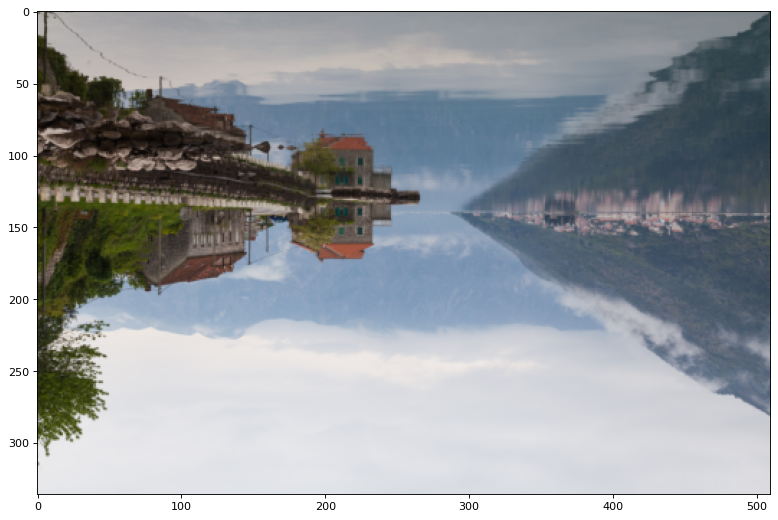

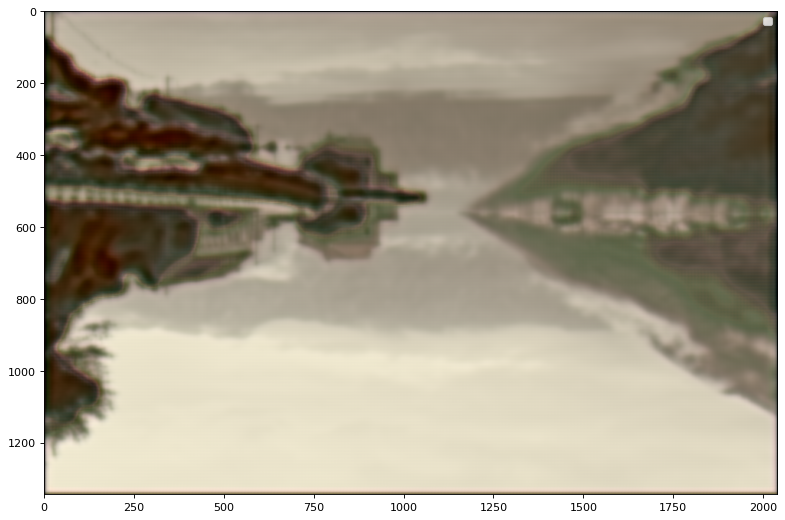

In [ ]:
img = downsize(dataset[100])
figure(figsize=(12, 8), dpi=80)
plt.show()
s = img.shape

with torch.no_grad():
    generator.eval()
    reconstructed = generator(img.to(device).view(1, s[0], s[1], s[2]))

figure(figsize=(12, 8), dpi=80)
r = reconstructed.shape
reconstructed = reconstructed.cpu().view(r[1], r[2], r[3]).permute(1, 2, 0)
reconstructed = np.array(reconstructed, dtype=np.float32)
plt.show()  

Что ж, теперь перейдем к настоящему обучению генератора с использованием дискриминатора

Для этого придется переделать класс MyDataset, поскольку теперь мы будем использовать изображения фиксированного размера 1024*1024 (из-за того, что дисриминатор не может обрабатывать изображения разного размера).

In [8]:
class MyDataset_v2(torch.utils.data.Dataset):
    def __init__(self, files):
        super().__init__()
        self.files = files
        self.len_ = len(self.files)

    def __len__(self):
        return self.len_

    def __getitem__(self, index):
        
        fpath = self.files[index]
        photo = cv2.imread(fpath)[:,:,::-1]
        #photo = change_size(torch.from_numpy(photo.copy()))
        
        new_img = resize(photo, [1024, 1024])
        #x = np.array(np.array(new_img) / 255, dtype=np.float32)
        return torch.from_numpy(new_img).permute(2, 0, 1)

Функцию для получения путей изображений также пришлось переделать:

In [ ]:
def load_dataset():
    folder_name = '/content/drive/MyDrive/Flickr2K'
    #folder_name = 'Flickr2K'
    dataset_size = 3800

    photo_paths = []
    #photos = []
    i = 0
    for dirpath, dirnames, filenames in os.walk(folder_name):
        for fname in filenames:
            if fname.endswith('.png'):
                fpath = os.path.join(dirpath, fname)
                photo = cv2.imread(fpath)[:,:,::-1]
                if photo.shape[0] >= 1024 and photo.shape[1] >= 1024:
                    photo_paths.append(fpath)
                    #photo = change_size(torch.from_numpy(photo.copy()))
                    #photos.append(photo)
                    i += 1
                    if i % 50 == 0:
                        print('i =', i)
            if i >= dataset_size:
                break
        if i >= dataset_size:
            break        
                
    #print(len(photo_paths), len(photos))
    return photo_paths#, np.array(photos)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
photo_paths = load_dataset()

Для удобства сохраняем пути до изображений в файл, что каждый раз не прогонять функцию load_dataset

In [ ]:
!pip install pickle

In [ ]:
#local
import pickle
with open("photo_paths_local.pkl", "wb") as f:
    pickle.dump(photo_paths, f)
    

In [ ]:
import pickle
with open("photo_paths.pkl", "wb") as f:
    pickle.dump(photo_paths, f)
    

In [ ]:
import pickle

with open("photo_paths.pkl", "rb") as f:
    photo_paths = pickle.load(f)
print(len(photo_paths))

3276


In [9]:
#local
import pickle

with open("photo_paths_local.pkl", "rb") as f:
    photo_paths = pickle.load(f)
print(len(photo_paths))

3520


In [9]:
print(len(photo_paths))

3520


In [ ]:
loaded_data = loaded_data.transpose(0, 3, 1, 2)
loaded_dataloader = torch.utils.data.DataLoader(loaded_data, batch_size=1, shuffle=True)

In [10]:
batch_size=1
dataset_v2 = MyDataset_v2(photo_paths)
loaded_dataloader = torch.utils.data.DataLoader(dataset_v2, batch_size=batch_size, shuffle=True)

In [11]:
generator = Generator().to(device)

In [52]:
generator.load_state_dict(torch.load('generator_v3', map_location=torch.device(device)))

<All keys matched successfully>

In [24]:
discriminator = Discriminator().to(device)

In [35]:
discriminator.load_state_dict(torch.load('discriminator_v1', map_location=torch.device(device)))

<All keys matched successfully>

In [ ]:
for img in loaded_dataloader:
    print(img.shape, type(img))
    result = discriminator(img.to(device).type(torch.float32))
    print(result, result.shape)
    break

torch.Size([1, 3, 1024, 1024]) <class 'torch.Tensor'>
tensor([[0.4997]], device='cuda:0', grad_fn=<ViewBackward0>) torch.Size([1, 1])


Лосс генератора теперь будет состоять из двух частей: Adversarial Loss и Perceptual Loss. Первый - это просто BCE лосс, которы вычисляется между предсказаниями от дискриминатора и соответствующими таргетами. VGGPerceptualLoss определяется как евклидово расстояние между представлениями объектов восстановленного изображения на разных слоях нейтосети VGG16 и эталонным изображением (подробнее можно почитать тут: https://svl.stanford.edu/assets/papers/JohnsonECCV16.pdf)


Следующий код для VGGPerceptualLoss бы взят с https://gist.github.com/alper111/8233cdb0414b4cb5853f2f730ab95a49

In [14]:
class VGGPerceptualLoss(torch.nn.Module):
    def __init__(self, resize=True):
        super(VGGPerceptualLoss, self).__init__()
        blocks = []
        blocks.append(torchvision.models.vgg16(pretrained=True).features[:4].eval())
        blocks.append(torchvision.models.vgg16(pretrained=True).features[4:9].eval())
        blocks.append(torchvision.models.vgg16(pretrained=True).features[9:16].eval())
        blocks.append(torchvision.models.vgg16(pretrained=True).features[16:23].eval())
        for bl in blocks:
            for p in bl.parameters():
                p.requires_grad = False
        self.blocks = torch.nn.ModuleList(blocks)
        self.transform = torch.nn.functional.interpolate
        self.resize = resize
        self.register_buffer("mean", torch.tensor([0.485, 0.456, 0.406]).view(1, 3, 1, 1))
        self.register_buffer("std", torch.tensor([0.229, 0.224, 0.225]).view(1, 3, 1, 1))

    def forward(self, input, target, feature_layers=[0, 1, 2, 3], style_layers=[]):
        if input.shape[1] != 3:
            input = input.repeat(1, 3, 1, 1)
            target = target.repeat(1, 3, 1, 1)
        input = (input-self.mean) / self.std
        target = (target-self.mean) / self.std
        if self.resize:
            input = self.transform(input, mode='bilinear', size=(224, 224), align_corners=False)
            target = self.transform(target, mode='bilinear', size=(224, 224), align_corners=False)
        loss = 0.0
        x = input
        y = target
        for i, block in enumerate(self.blocks):
            x = block(x)
            y = block(y)
            if i in feature_layers:
                loss += torch.nn.functional.l1_loss(x, y)
            if i in style_layers:
                act_x = x.reshape(x.shape[0], x.shape[1], -1)
                act_y = y.reshape(y.shape[0], y.shape[1], -1)
                gram_x = act_x @ act_x.permute(0, 2, 1)
                gram_y = act_y @ act_y.permute(0, 2, 1)
                loss += torch.nn.functional.l1_loss(gram_x, gram_y)
        return loss

In [36]:
model = {
    "discriminator": discriminator,
    "generator": generator
}

criterion = {
    "discriminator": nn.BCELoss(),
    "generator_adversarial": nn.BCELoss(),
    "generator_perception": VGGPerceptualLoss().to(device)
}

C:\Users\serge\anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\serge\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Теперь переходим к обучению:

In [16]:
def train(model, loader, epochs, photos_num=3600, only_discriminator=False):
    model["discriminator"].train()
    model["generator"].train()
    
    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    
    # Create optimizers
    optimizer = {#, betas=(0.5, 0.999))
        "discriminator": torch.optim.Adam(model["discriminator"].parameters(), betas=(0.5, 0.999)),
        "generator": torch.optim.Adam(model["generator"].parameters(), betas=(0.5, 0.999))
    }
    for epoch in tqdm.notebook.tqdm(range(epochs)):
        loss_d_per_epoch = []
        loss_g_per_epoch = []
        real_score_per_epoch = []
        fake_score_per_epoch = []
        for i, real_images in enumerate(tqdm.notebook.tqdm(loader)):
            if i >= photos_num:
                break
            #Обучение дискриминатора
            real_images = real_images.to(device).type(torch.float32)
            optimizer["discriminator"].zero_grad()
            real_preds = model["discriminator"](real_images)
            real_targets = torch.ones(real_images.size(0), device=device)

            real_loss = criterion["discriminator"](real_preds, real_targets)

            cur_real_score = torch.mean(real_preds).item()

            #print("real:", real_images.shape)
            reduced = downsize(real_images)
            #print("reduced:", reduced.shape)
            fake_images = model["generator"](reduced)

            fake_targets = torch.zeros(fake_images.size(0), device=device)
            fake_preds = model["discriminator"](fake_images)
            fake_loss = criterion["discriminator"](fake_preds, fake_targets)
            cur_fake_score = torch.mean(fake_preds).item()

            real_score_per_epoch.append(cur_real_score)
            fake_score_per_epoch.append(cur_fake_score)

            loss_d = real_loss + fake_loss
            loss_d.backward()
            optimizer["discriminator"].step()
            loss_d_per_epoch.append(loss_d.item())

            if only_discriminator:
                continue

            #Обучение генератора
            optimizer["generator"].zero_grad()

            reduced = downsize(real_images)
            fake_images = model["generator"](reduced)

            preds = model["discriminator"](fake_images)
            targets = torch.ones(real_images.size(0), device=device)
            loss_g_adversarial = criterion["generator_adversarial"](preds, targets)
            loss_g_perception = criterion["generator_perception"](fake_images, real_images)

            loss_g = loss_g_adversarial + loss_g_perception * 0.001

            loss_g.backward()
            optimizer["generator"].step()
            loss_g_per_epoch.append(loss_g.item())
            

        losses_g = losses_g + loss_g_per_epoch
        losses_d = losses_d + loss_d_per_epoch
        real_scores = real_scores + real_score_per_epoch
        fake_scores = fake_scores + fake_score_per_epoch
    return losses_g, losses_d, real_scores, fake_scores

In [ ]:
losses_g, losses_d, real_scores, fake_scores = train(model, loaded_dataloader, 1)

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

In [ ]:
losses_g1, losses_d1, real_scores1, fake_scores1 = train(model, loaded_dataloader, 1)

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

In [ ]:
losses_g2, losses_d2, real_scores2, fake_scores2 = train(model, loaded_dataloader, 1)

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

In [ ]:
losses_g3, losses_d3, real_scores3, fake_scores3 = train(model, loaded_dataloader, 1)

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1800 [00:00<?, ?it/s]

In [ ]:
torch.cuda.empty_cache()

In [24]:
losses_g4, losses_d4, real_scores4, fake_scores4 = train(model, loaded_dataloader, 1)

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/3520 [00:00<?, ?it/s]

In [46]:
losses_g5, losses_d5, real_scores5, fake_scores5 = train(model, loaded_dataloader, 8, 600, False)

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/3520 [00:00<?, ?it/s]

  0%|          | 0/3520 [00:00<?, ?it/s]

  0%|          | 0/3520 [00:00<?, ?it/s]

  0%|          | 0/3520 [00:00<?, ?it/s]

  0%|          | 0/3520 [00:00<?, ?it/s]

  0%|          | 0/3520 [00:00<?, ?it/s]

  0%|          | 0/3520 [00:00<?, ?it/s]

  0%|          | 0/3520 [00:00<?, ?it/s]

In [44]:
torch.save(model['discriminator'].state_dict(), 'discriminator_v3')

In [51]:
torch.save(model['generator'].state_dict(), 'generator_v4')

In [20]:
def show_results_of_train(losses_g, losses_d, real_scores, fake_scores):
    plt.plot(losses_g, label='loss_g')
    plt.plot(losses_d, label='losses_d')
    plt.legend()
    plt.show()

    plt.plot(real_scores, label='real_scores')
    plt.plot(fake_scores, label='fake_scores')
    plt.legend()
    plt.show()

In [ ]:
loss_g = losses_g + losses_g1 + losses_g2
loss_d = losses_d + losses_d1 + losses_d2
real_score = real_scores + real_scores1 + real_scores2
fake_score = fake_scores + fake_scores1 + fake_scores2

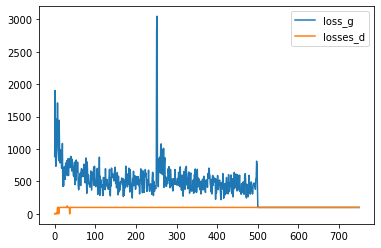

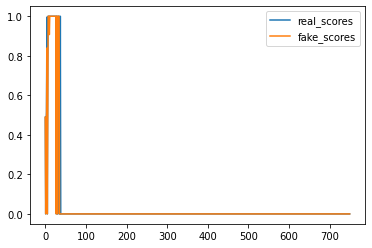

In [ ]:
show_results_of_train(loss_g, loss_d, real_score, fake_score)

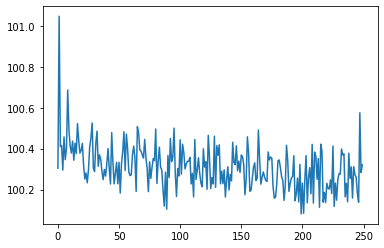

In [ ]:
plt.plot(losses_g2)
plt.show()

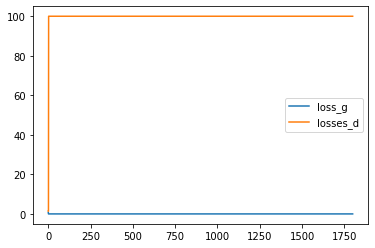

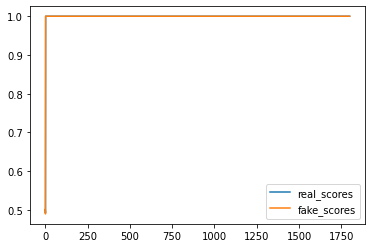

In [ ]:
show_results_of_train(losses_g3, losses_d3, real_scores3, fake_scores3)

In [ ]:
show_results_of_train(losses_g4, losses_d4, real_scores4, fake_scores4)

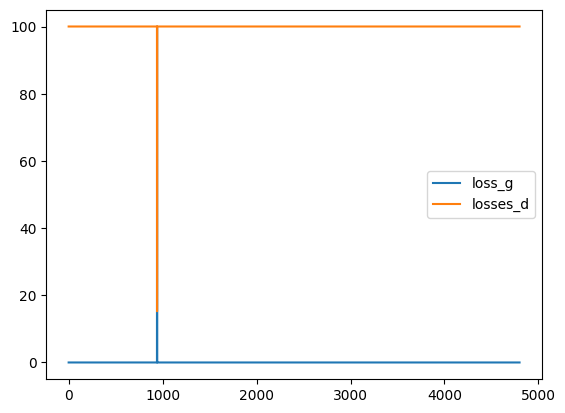

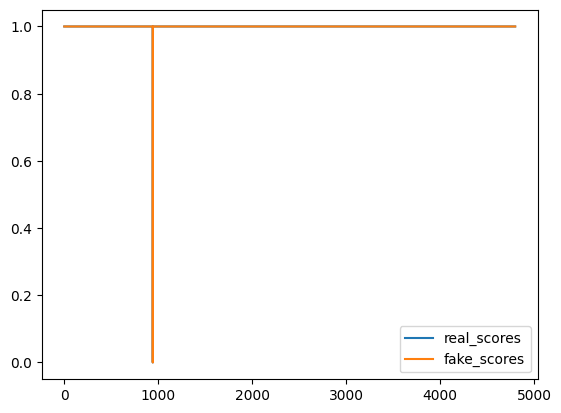

In [47]:
show_results_of_train(losses_g5, losses_d5, real_scores5, fake_scores5)

Теперь проверим, на что способен генератор:

In [42]:
def check_generator_capabilities(index):
    IMAGE_SIZE = 8
    img = torch.from_numpy(dataset_v2[index].numpy()) 
    figure(figsize=(IMAGE_SIZE, IMAGE_SIZE))
    plt.title('ground_truth')
    plt.imshow(img.permute(1, 2, 0))
    plt.show()


    reduced_img = downsize(img)

    with torch.no_grad():
        generator.eval()
        reconstructed = generator(reduced_img.type(torch.float32).view(1, *reduced_img.shape[0:]).to(device))

    figure(figsize=(IMAGE_SIZE, IMAGE_SIZE))
    plt.imshow(reconstructed.view(*reconstructed.shape[1:]).permute(1, 2, 0).cpu())
    plt.title('reconstructed')
    plt.show()

    figure(figsize=(IMAGE_SIZE, IMAGE_SIZE))

    plt.imshow(reduced_img.permute(1, 2, 0))
    plt.title('reduced')
    plt.show()

    

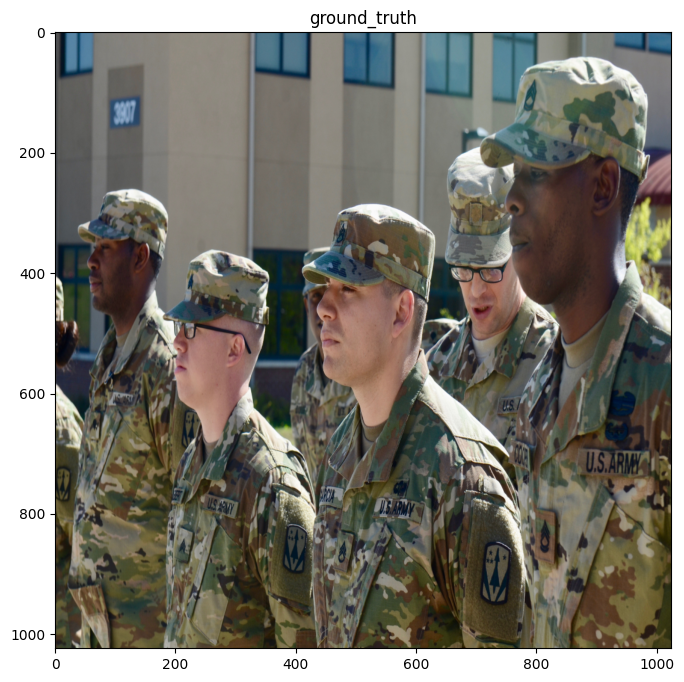

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


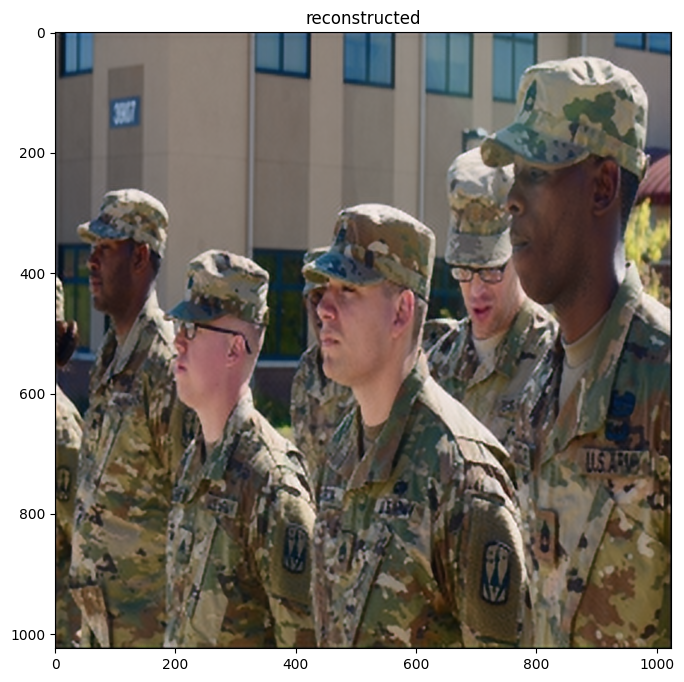

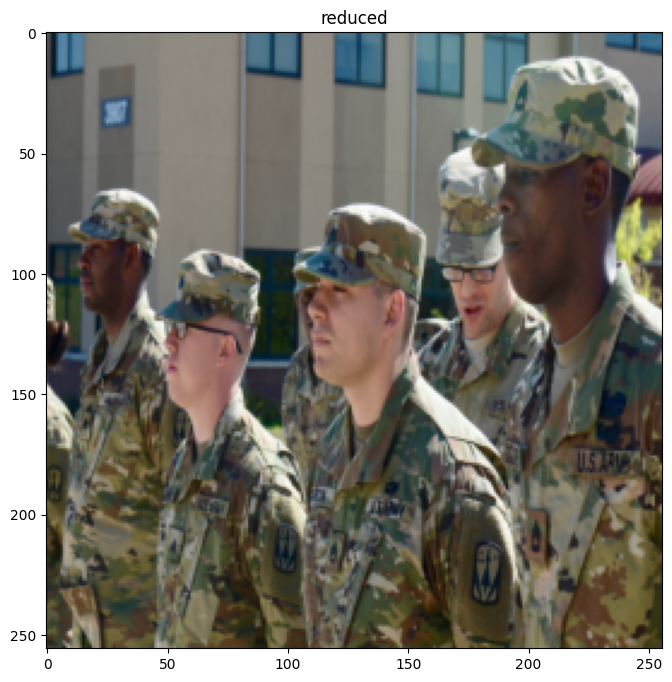

In [54]:
check_generator_capabilities(6)

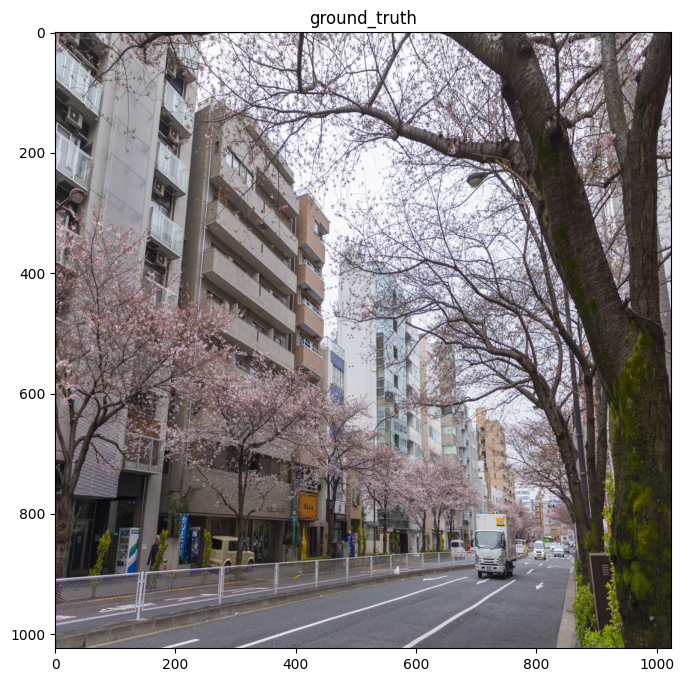

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


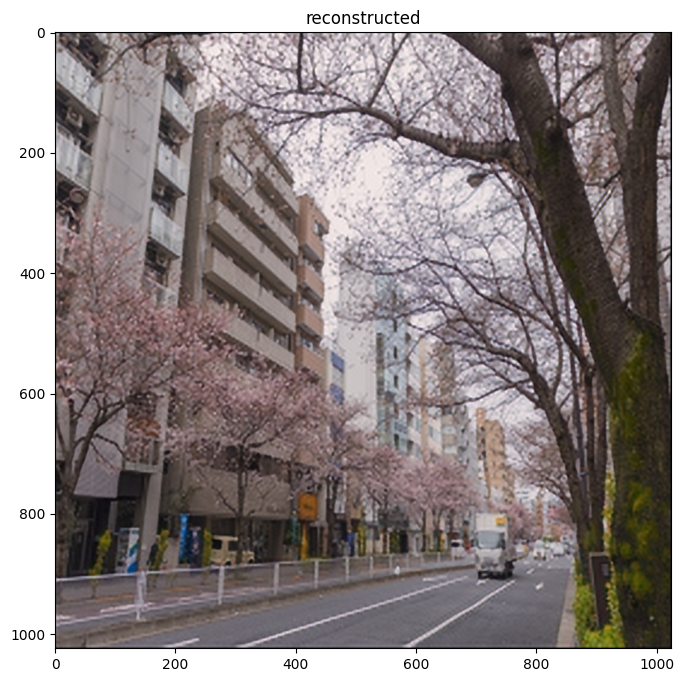

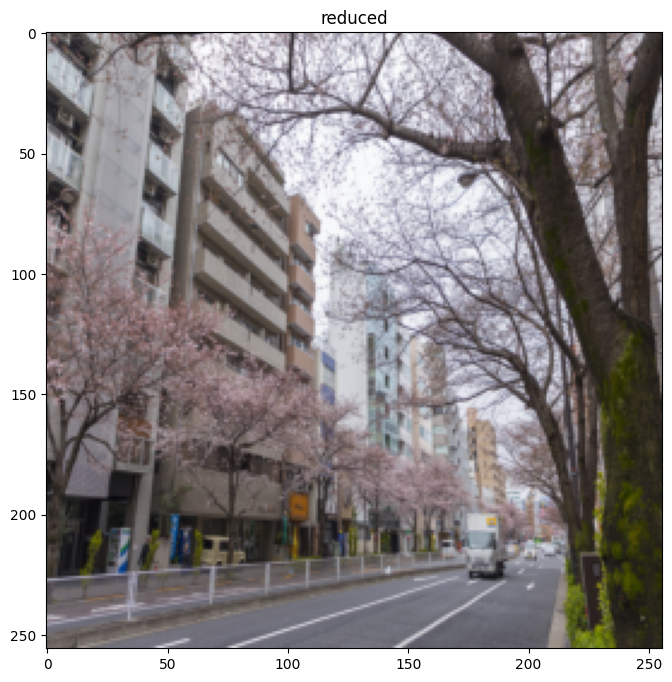

In [53]:
check_generator_capabilities(110)

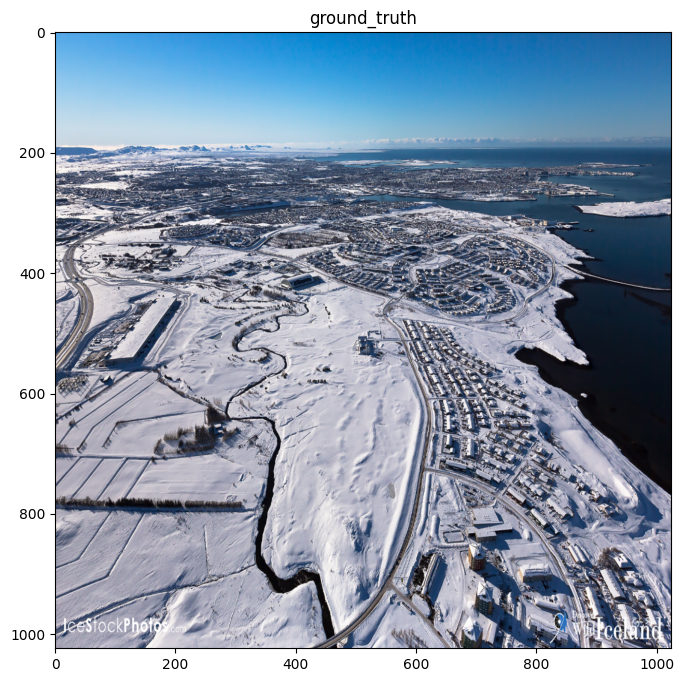

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


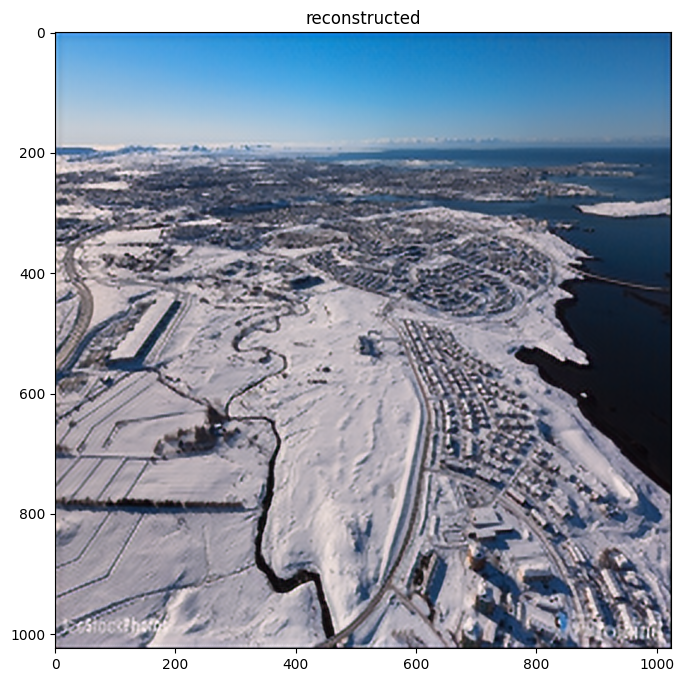

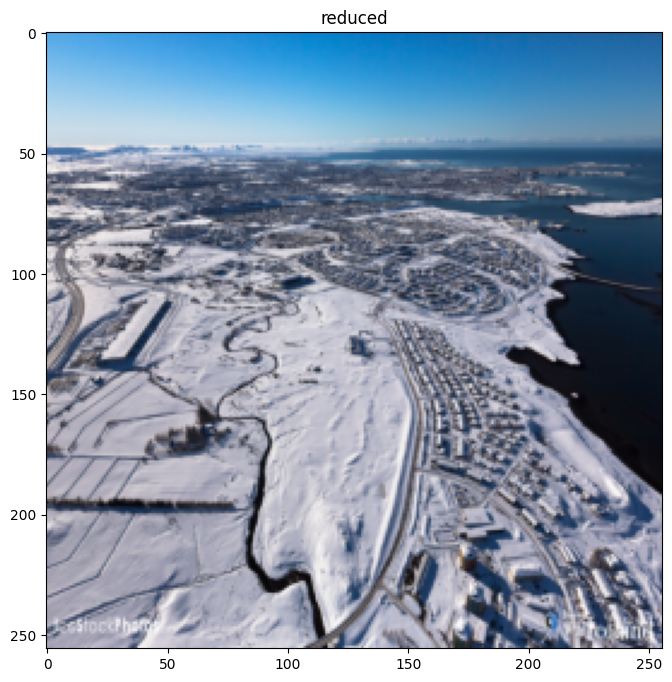

In [55]:
check_generator_capabilities(1002)

Как можно заметить, генератор действительно улучшает качество изображений. Однако, еще есть куда стремиться